# Energy Demand, Price & Generation Forecasting Notebook 🚀

In [1]:
!pip install shap xgboost --quiet

In [3]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
import shap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, accuracy_score

energy_df = pd.read_csv("/content/energy_dataset.csv")
weather_df = pd.read_csv("/content/weather_features.csv")


In [4]:

energy_df['time'] = pd.to_datetime(energy_df['time'], utc=True).dt.tz_localize(None)
weather_df['dt_iso'] = pd.to_datetime(weather_df['dt_iso'], utc=True).dt.tz_localize(None)
weather_agg = weather_df.groupby('dt_iso').mean(numeric_only=True).reset_index()
merged_df = pd.merge(energy_df, weather_agg, how='inner', left_on='time', right_on='dt_iso')
merged_df.drop(columns=['dt_iso'], inplace=True)
merged_df['hour'] = merged_df['time'].dt.hour
merged_df['dayofweek'] = merged_df['time'].dt.dayofweek
merged_df['month'] = merged_df['time'].dt.month
merged_df['is_weekend'] = merged_df['dayofweek'].isin([5, 6]).astype(int)
merged_df = merged_df.loc[:, merged_df.isnull().mean() < 0.9]
merged_df.fillna(method='ffill', inplace=True)


<ipython-input-4-ae1e7468c80e>:11: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  merged_df.fillna(method='ffill', inplace=True)


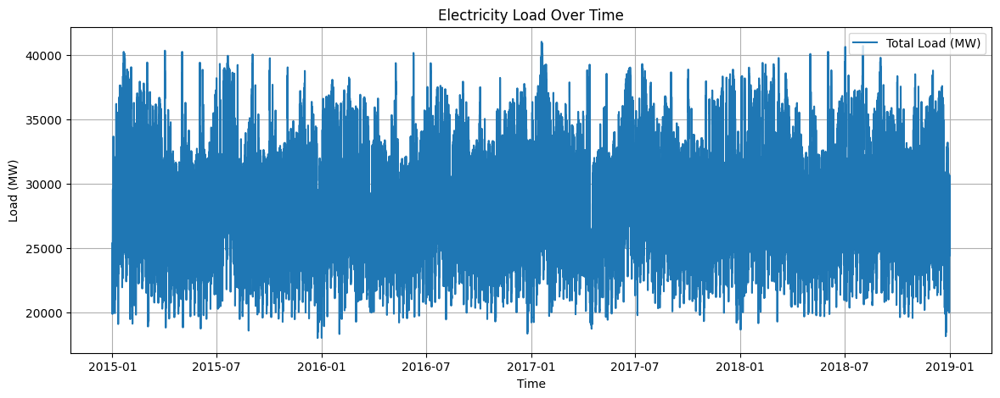

<Figure size 1400x600 with 0 Axes>

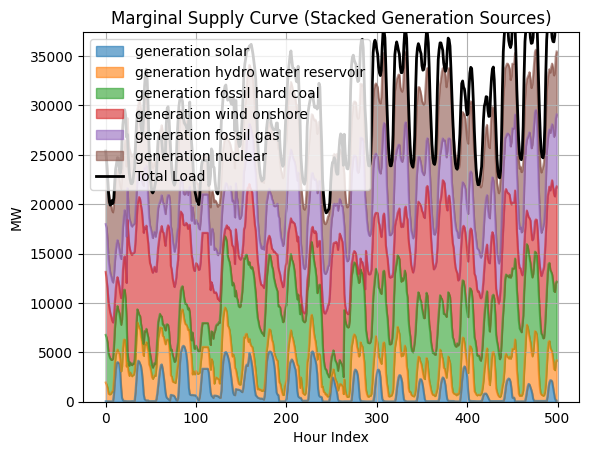

In [5]:

# Load curve
plt.figure(figsize=(14, 5))
plt.plot(merged_df['time'], merged_df['total load actual'], label='Total Load (MW)')
plt.title("Electricity Load Over Time")
plt.xlabel("Time")
plt.ylabel("Load (MW)")
plt.legend()
plt.grid(True)
plt.show()

# Marginal supply
gen_sources = ['generation wind onshore', 'generation solar', 'generation hydro water reservoir',
               'generation nuclear', 'generation fossil gas', 'generation fossil hard coal']
supply_df = merged_df[gen_sources + ['total load actual']].copy()
supply_df['stacked_supply'] = supply_df[gen_sources].sum(axis=1)
supply_df_sorted = supply_df[gen_sources].mean().sort_values().index.tolist()

plt.figure(figsize=(14, 6))
supply_df[supply_df_sorted].iloc[:500].plot.area(stacked=True, alpha=0.6)
plt.plot(supply_df['total load actual'].iloc[:500].values, color='black', linewidth=2, label='Total Load')
plt.title("Marginal Supply Curve (Stacked Generation Sources)")
plt.xlabel("Hour Index")
plt.ylabel("MW")
plt.legend()
plt.grid(True)
plt.show()


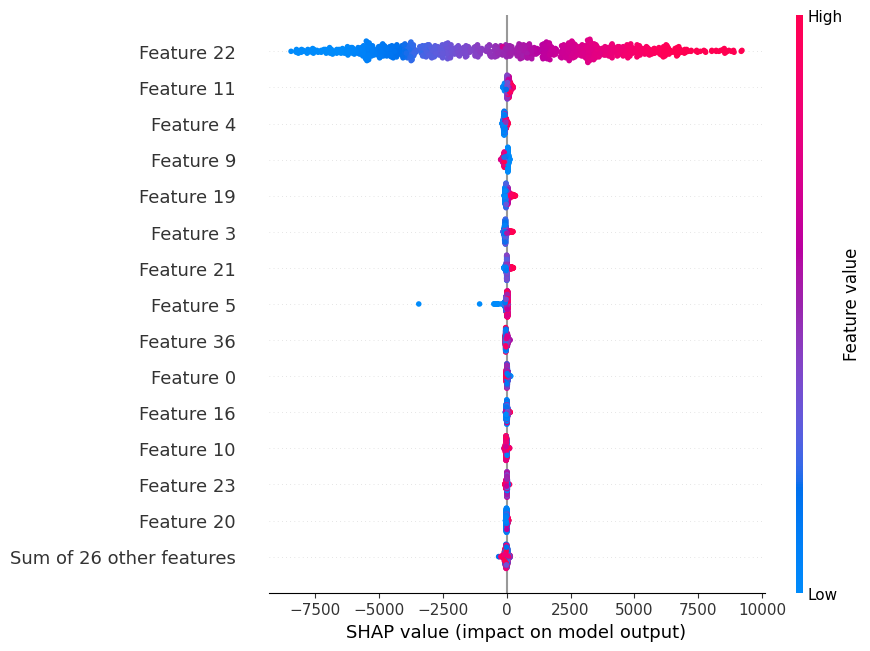

In [6]:

targets = ['total load actual', 'price actual']
features = merged_df.drop(columns=['time'] + targets)
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

X_train, X_test, y_train, y_test = train_test_split(
    scaled_features, merged_df[targets], test_size=0.2, shuffle=False
)

model_load = xgb.XGBRegressor(n_estimators=300, max_depth=6, learning_rate=0.05)
model_load.fit(X_train, y_train['total load actual'])

explainer = shap.Explainer(model_load)
shap_values = explainer(X_test[:1000])
shap.plots.beeswarm(shap_values, max_display=15)


In [7]:

model_price = xgb.XGBRegressor(n_estimators=300, max_depth=6, learning_rate=0.05)
model_price.fit(X_train, y_train['price actual'])

y_pred_load = model_load.predict(X_test)
y_pred_price = model_price.predict(X_test)

print("Load Forecast vs TSO:")
print("MAE Model:", mean_absolute_error(y_test['total load actual'], y_pred_load))
print("MAE TSO :", mean_absolute_error(y_test['total load actual'], X_test[:, features.columns.get_loc('total load forecast')]))

print("\nPrice Forecast vs TSO:")
print("MAE Model:", mean_absolute_error(y_test['price actual'], y_pred_price))
print("MAE TSO :", mean_absolute_error(y_test['price actual'], X_test[:, features.columns.get_loc('price day ahead')]))


Load Forecast vs TSO:
MAE Model: 264.16735632708895
MAE TSO : 28861.36856856165

Price Forecast vs TSO:
MAE Model: 7.588882901827993
MAE TSO : 64.44889107744957


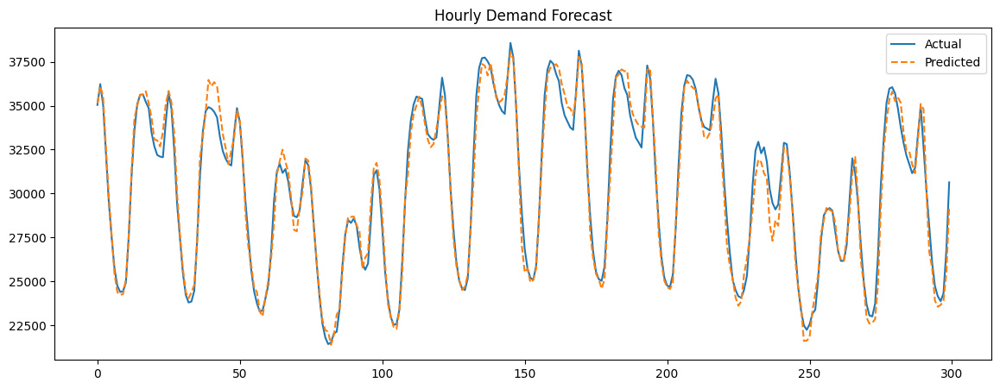

In [8]:

df_hour = merged_df.copy()
df_hour['target'] = df_hour['total load actual'].shift(-1)
df_hour.dropna(inplace=True)
X = df_hour.drop(columns=['time', 'total load actual', 'price actual', 'target'])
y = df_hour['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=False, test_size=0.2)
xgb_hourly = xgb.XGBRegressor(n_estimators=200)
xgb_hourly.fit(X_train, y_train)

y_pred_hour = xgb_hourly.predict(X_test)
plt.figure(figsize=(14, 5))
plt.plot(y_test.values[:300], label="Actual")
plt.plot(y_pred_hour[:300], label="Predicted", linestyle='--')
plt.title("Hourly Demand Forecast")
plt.legend()
plt.show()


In [9]:

merged_df['load_change'] = merged_df['total load actual'].diff()
gen_changes = merged_df[gen_sources].diff()
merged_df['next_source'] = gen_changes.idxmax(axis=1)
merged_df = merged_df.dropna(subset=['next_source'])

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
merged_df['target_class'] = le.fit_transform(merged_df['next_source'])

X = merged_df.drop(columns=['time', 'next_source', 'target_class', 'load_change', 'total load actual', 'price actual'])
y = merged_df['target_class']

X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=False, test_size=0.2)
clf = xgb.XGBClassifier(n_estimators=200)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

print("Generation Source Activation Accuracy:", accuracy_score(y_test, y_pred))


<ipython-input-9-16e5d6035ea3>:3: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  merged_df['next_source'] = gen_changes.idxmax(axis=1)
<ipython-input-9-16e5d6035ea3>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df['target_class'] = le.fit_transform(merged_df['next_source'])


Generation Source Activation Accuracy: 0.5318693854270641


In [18]:
!pip install plotly --quiet

In [19]:
import pandas as pd
import plotly.express as px
from google.colab import files

In [20]:
fig = px.line(merged_df, x='time', y='total load actual', title='Total Electricity Load Over Time')
fig.show()

fig = px.line(merged_df, x='time', y='price actual', title='Electricity Price Over Time')
fig.show()

In [21]:
sources = ['generation solar', 'generation wind onshore', 'generation fossil gas',
           'generation nuclear', 'generation hydro water reservoir']

for src in sources:
    if src in energy_df.columns:
        fig = px.line(energy_df, x='time', y=src, title=f"{src} Over Time")
        fig.show()

In [22]:
import plotly.graph_objects as go
for metric in ['total load', 'price']:
    actual = f"{metric} actual"
    forecast = f"{metric} day ahead" if metric == 'price' else f"{metric} forecast"
    if forecast in energy_df.columns:
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=energy_df['time'], y=energy_df[actual], mode='lines', name='Actual'))
        fig.add_trace(go.Scatter(x=energy_df['time'], y=energy_df[forecast], mode='lines', name='Forecast'))
        fig.update_layout(title=f"{metric.title()} Forecast vs Actual", xaxis_title="Time", yaxis_title=metric.title())
        fig.show()

In [25]:
!pip install geopy --quiet

from geopy.geocoders import Nominatim
import time

geolocator = Nominatim(user_agent="weather_mapper")
city_coords = {}

for city in latest['city_name'].unique():
    try:
        location = geolocator.geocode(city)
        if location:
            city_coords[city] = (location.latitude, location.longitude)
        time.sleep(1)  # Respect API rate limits
    except:
        city_coords[city] = (None, None)

# Add to DataFrame
latest['latitude'] = latest['city_name'].map(lambda x: city_coords[x][0])
latest['longitude'] = latest['city_name'].map(lambda x: city_coords[x][1])

fig = px.scatter_geo(
    latest,
    lat='latitude',
    lon='longitude',
    text='city_name',
    size='wind_speed',
    color='temp',
    title="🌍 Weather Overview by City (Last Timestamp)",
    template="plotly_dark"
)
fig.show()

<ipython-input-25-dc24f127704f>:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-25-dc24f127704f>:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [24]:
stack_sources = ['generation solar', 'generation wind onshore', 'generation fossil gas',
                 'generation nuclear', 'generation hydro water reservoir']
stack_df = energy_df[['time'] + stack_sources].dropna()
fig = px.area(stack_df, x='time', y=stack_sources, title="Stacked Generation Mix Over Time")
fig.show()

In [29]:
# Merge datasets
energy_df['time'] = pd.to_datetime(energy_df['time'], utc=True).dt.tz_localize(None)
weather_df['dt_iso'] = pd.to_datetime(weather_df['dt_iso'], utc=True).dt.tz_localize(None)
weather_df = weather_df.groupby('dt_iso').mean(numeric_only=True).reset_index()
df = pd.merge(energy_df, weather_df, how='inner', left_on='time', right_on='dt_iso')
df.drop(columns=['dt_iso'], inplace=True)

# Feature engineering
df['hour'] = df['time'].dt.hour
df['dayofweek'] = df['time'].dt.dayofweek
df['month'] = df['time'].dt.month
df = df.ffill()  # preferred syntax

# Define generation sources
gen_sources = [
    'generation wind onshore', 'generation solar', 'generation hydro water reservoir',
    'generation nuclear', 'generation fossil gas', 'generation fossil hard coal'
]

# Add lag features
for col in ['total load actual', 'temp', 'wind_speed'] + gen_sources:
    for lag in [1, 2, 3]:
        df[f"{col}_lag{lag}"] = df[col].shift(lag)

# Calculate deltas & target
df['load_change'] = df['total load actual'].diff()
gen_changes = df[gen_sources].diff()
gen_changes_clean = gen_changes.dropna(how='all')
df.loc[gen_changes_clean.index, 'next_source'] = gen_changes_clean.idxmax(axis=1)

# Drop remaining missing rows and encode
df.dropna(subset=['next_source'], inplace=True)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['target_class'] = le.fit_transform(df['next_source'])

# Prepare dataset
X = df.drop(columns=['time', 'next_source', 'target_class', 'load_change'])
y = df['target_class']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=False, test_size=0.2)

import xgboost as xgb
from sklearn.metrics import accuracy_score

clf = xgb.XGBClassifier(n_estimators=300, max_depth=6, learning_rate=0.05,
                        use_label_encoder=False, eval_metric='mlogloss')
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

print("✅ Enhanced Accuracy with Lag Features:", accuracy_score(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[17:20:47] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




✅ Enhanced Accuracy with Lag Features: 0.7839726222729217
